In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
import math
from scipy.optimize import curve_fit
from sklearn.metrics import mean_squared_error
import math
from random import seed
from random import randint

C:\Users\Agni\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\Agni\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\Agni\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:519: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\Agni\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:520: FutureWarning: Passing (

## Average temperature model – Spokane, WA

In [2]:
avg_temps = pd.read_csv("../data_KS_WA/WA/WA_Climate/WA_Spokane_Avg_Temp_Additional.csv")
# avg_temps.loc[avg_temps[0].type() == int]
avg_temps.columns = ["date", "value", "anomaly"]
print(len(avg_temps))

avg_temps_years = avg_temps['date'].astype(float)
print(len(avg_temps_years))

i = 0
frac = 0
for element in avg_temps_years:
    mod = element % 100
    element = (element - mod) / 100 + frac/12
    avg_temps_years[i] = element
    i += 1
    if (frac % 12 != 11):
        frac += 1
    else:
        frac = 0

avg_temps['date'] = avg_temps_years
avg_temps.head()

1500
1500


,date,value,anomaly
0,1895.000000,24.3,-5.1
1,1895.083333,32.6,0.5
2,1895.166667,36.5,-2.5
3,1895.250000,46.8,1.2
4,1895.333333,51.4,-2.4


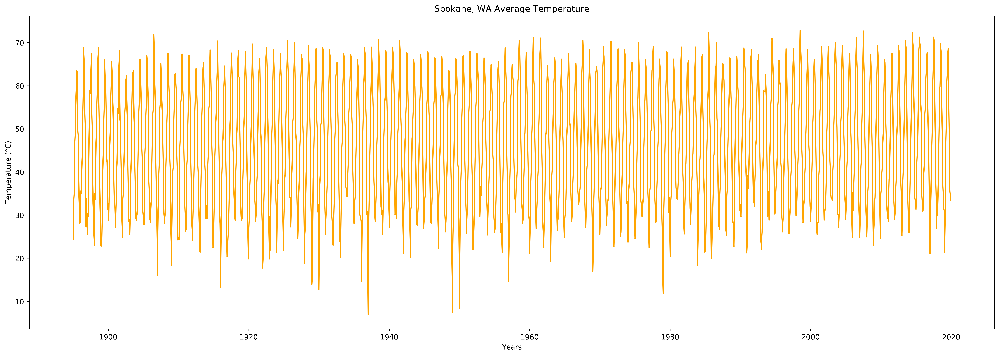

In [3]:
x_avg = avg_temps['date']
y_avg = avg_temps['value']

plt.figure(figsize=(24, 8), dpi=400)
plt.plot(x_avg, y_avg, color='orange')

plt.xlabel("Years")
plt.ylabel("Temperature (°C)")
plt.title("Spokane, WA Average Temperature")
plt.show()

In [4]:
x_avg[0:1200]

0       1895.000000
1       1895.083333
2       1895.166667
3       1895.250000
4       1895.333333
           ...     
1195    1994.583333
1196    1994.666667
1197    1994.750000
1198    1994.833333
1199    1994.916667
Name: date, Length: 1200, dtype: float64

[ 2.56166923e+01  1.03784398e-02 -8.56854070e+00  1.00003476e+00
 -1.75726081e+01]
Mean Squared Error:  14.767630042618629
Root Mean Squared Error:  3.842867424543635
R^2:  0.9283090466133446
Test Mean Squared Error:  13.503745672473652
Test Root Mean Squared Error:  3.6747443002845315
Test R^2:  0.931626573571021


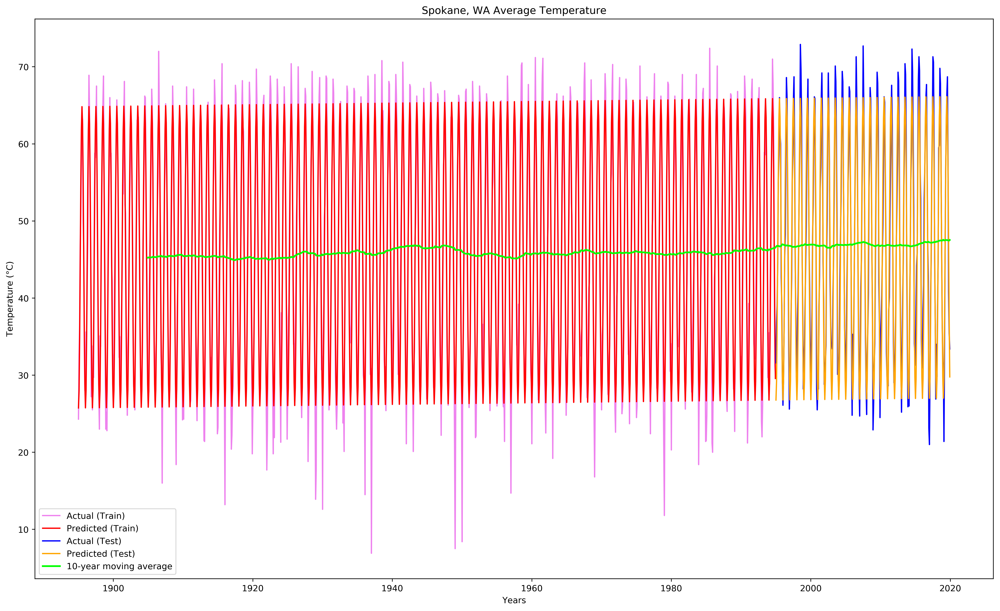

In [15]:
x2_avg = np.nan_to_num(x_avg[0:1200])
N = len(x2_avg)
y2_avg = np.asarray(y_avg[0:1200])

def test_func(t, a, b, c, d, e):
    return  a + b*t + c*np.sin(2*np.pi*d*t) + e*np.cos(2*np.pi*d*t)

params, _ = curve_fit(test_func, x2_avg, y2_avg)

# def test_func(m, a, b, c, d, e):
#     return  100 * a * np.sin(20 * b * m + c) + d + e * m

# params, _ = curve_fit(test_func, x, y, p0  = [100, 2 * numpy.pi / 365, 0, -10, 0])

print(params)
print("Mean Squared Error: ", np.mean((y2_avg - test_func(x2_avg, *params))**2))
print("Root Mean Squared Error: ", math.sqrt(np.mean((y2_avg - test_func(x2_avg, *params))**2)))
residuals = y2_avg - test_func(x2_avg, *params)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((y2_avg - np.mean(y2_avg))**2)
print("R^2: ", 1 - (ss_res / ss_tot))

rolling_mean = avg_temps.value.rolling(window=120).mean()

x3_avg = np.nan_to_num(x_avg[1200:])
N = len(x3_avg)
y3_avg = np.asarray(y_avg[1200:])

print("Test Mean Squared Error: ", np.mean((y3_avg - test_func(x3_avg, *params))**2))
print("Test Root Mean Squared Error: ", math.sqrt(np.mean((y3_avg - test_func(x3_avg, *params))**2)))
residuals = y3_avg - test_func(x3_avg, *params)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((y3_avg - np.mean(y3_avg))**2)
print("Test R^2: ", 1 - (ss_res / ss_tot))

plt.figure(figsize=(20, 12), dpi=400)
plt.plot(x2_avg, y2_avg, color='violet', label='Actual (Train)')
plt.plot(x2_avg, test_func(x2_avg, params[0], params[1], params[2], params[3], params[4]), color='red', label='Predicted (Train)')
plt.plot(x3_avg, y3_avg, color='blue', label='Actual (Test)')
plt.plot(x3_avg, test_func(x3_avg, params[0], params[1], params[2], params[3], params[4]), color='orange', label='Predicted (Test)')
plt.plot(avg_temps.date, rolling_mean, color='lime', label='10-year moving average', linewidth=2)
plt.xlabel("Years")
plt.ylabel("Temperature (°C)")
plt.title("Spokane, WA Average Temperature")
plt.legend(loc='best')
plt.show()

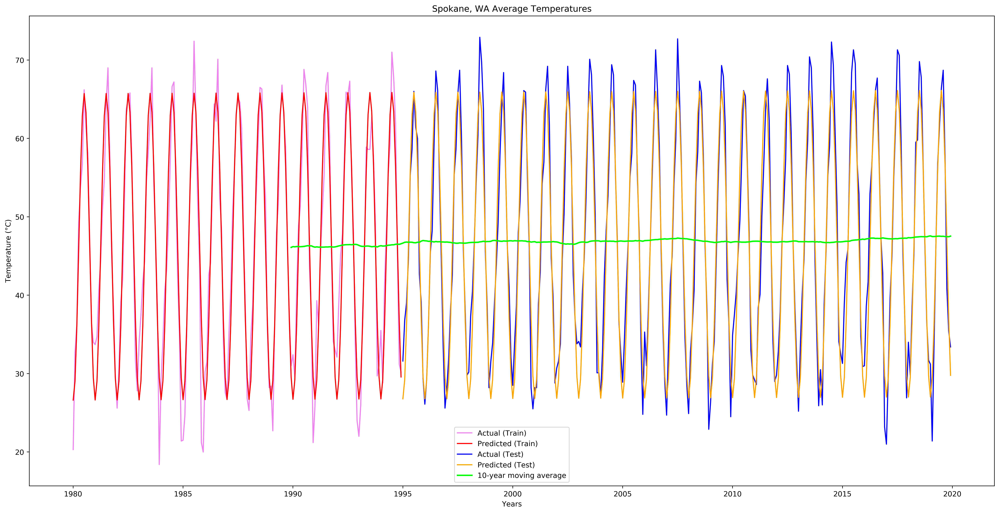

In [14]:
plt.figure(figsize=(24, 12), dpi=400)
plt.plot(x2_avg[1020:], y2_avg[1020:], color='violet', label='Actual (Train)')
plt.plot(x2_avg[1020:], test_func(x2_avg[1020:], params[0], params[1], params[2], params[3], params[4]), color='red', label='Predicted (Train)')
plt.plot(x3_avg, y3_avg, color='blue', label='Actual (Test)')
plt.plot(x3_avg, test_func(x3_avg, params[0], params[1], params[2], params[3], params[4]), color='orange', label='Predicted (Test)')

rolling_mean = avg_temps.value[1020:].rolling(window=120).mean()
plt.plot(avg_temps.date[1020:], rolling_mean, color='lime', label='10-year moving average', linewidth=2)

plt.xlabel("Years")
plt.ylabel("Temperature (°C)")
plt.title("Spokane, WA Average Temperatures")
plt.legend(loc='best')
plt.show()

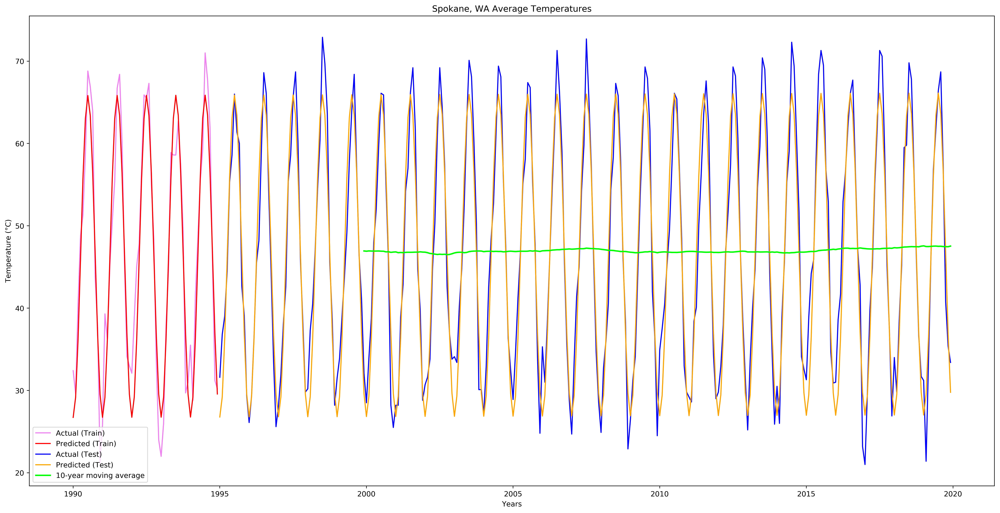

In [16]:
plt.figure(figsize=(24, 12), dpi=400)
plt.plot(x2_avg[1140:], y2_avg[1140:], color='violet', label='Actual (Train)')
plt.plot(x2_avg[1140:], test_func(x2_avg[1140:], params[0], params[1], params[2], params[3], params[4]), color='red', label='Predicted (Train)')
plt.plot(x3_avg, y3_avg, color='blue', label='Actual (Test)')
plt.plot(x3_avg, test_func(x3_avg, params[0], params[1], params[2], params[3], params[4]), color='orange', label='Predicted (Test)')

rolling_mean = avg_temps.value[1140:].rolling(window=120).mean()
plt.plot(avg_temps.date[1140:], rolling_mean, color='lime', label='10-year moving average', linewidth=2)

plt.xlabel("Years")
plt.ylabel("Temperature (°C)")
plt.title("Spokane, WA Average Temperatures")
plt.legend(loc='best')
plt.show()

[ 2.56410069e+01  1.03657286e-02 -4.01574026e+01  9.99610784e-01
 -2.07187749e+01  9.99223982e-01]
Mean Squared Error:  13.64244430580682
Root Mean Squared Error:  3.693567964151576
R^2:  0.930924301695349


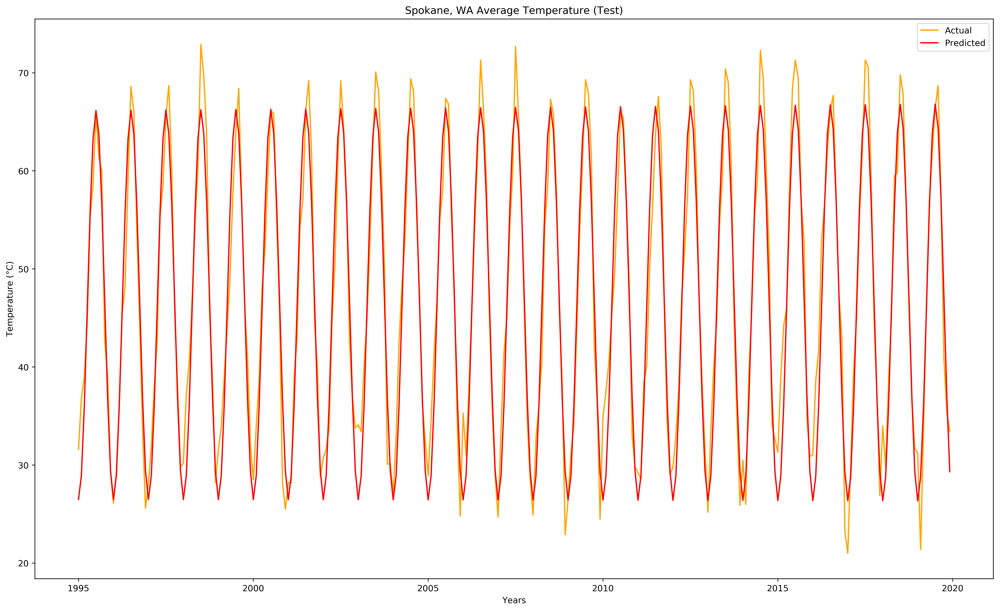

In [8]:
x3_avg = np.nan_to_num(x_avg[1200:])
N = len(x3_avg)
y3_avg = np.asarray(y_avg[1200:])

# def test_func(t, a, b, c, d, e, f):
#     return  a + b*t + c*np.sin(2*np.pi*d*t) + e*np.cos(2*np.pi*f*t)

# def test_func(t, f, a, b, c, d):
#     return  a + b*t + c*np.sin(2*np.pi*f*t)+d*np.cos(2*np.pi*f*t)

# params, _ = curve_fit(test_func, x3_avg, y3_avg)

# def test_func(m, a, b, c, d, e):
#     return  100 * a * np.sin(20 * b * m + c) + d + e * m

# params, _ = curve_fit(test_func, x, y, p0  = [100, 2 * numpy.pi / 365, 0, -10, 0])

print(params)
print("Mean Squared Error: ", np.mean((y3_avg - test_func(x3_avg, *params))**2))
print("Root Mean Squared Error: ", math.sqrt(np.mean((y3_avg - test_func(x3_avg, *params))**2)))
residuals = y3_avg - test_func(x3_avg, *params)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((y3_avg - np.mean(y3_avg))**2)
print("R^2: ", 1 - (ss_res / ss_tot))

# x = np.linspace(tick_list[0],tick_list[-1],100)
# y = 44.69 + 0.0019*(x/12) + 33.69*np.sin(1.728*(x/12) + 0.704)

plt.figure(figsize=(20, 12), dpi=400)
plt.plot(x3_avg, y3_avg, color='orange', label='Actual')
plt.plot(x3_avg, test_func(x3_avg, params[0], params[1], params[2], params[3], params[4], params[5]), color='red', label='Predicted')

plt.xlabel("Years")
plt.ylabel("Temperature (°C)")
plt.title("Spokane, WA Average Temperature (Test)")
plt.legend(loc='best')
plt.show()

## Precipitation model – Spokane, WA

In [98]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

import itertools
import warnings
warnings.filterwarnings('ignore')

In [152]:
rainfall_data = pd.read_csv("../data_KS_WA/WA/WA_Climate/WA_Spokane_Precipitation.csv")
# avg_temps.loc[avg_temps[0].type() == int]
rainfall_data.columns = ["date", "value", "anomaly"]
print(len(rainfall_data))

rainfall_data_years = rainfall_data['date'].astype(float)
print(len(rainfall_data_years))

i = 0
frac = 0
for element in rainfall_data_years:
    mod = element % 100
    element = (element - mod) / 100 + frac/12
    rainfall_data_years[i] = element
    i += 1
    if (frac % 12 != 11):
        frac += 1
    else:
        frac = 0

rainfall_data['date'] = rainfall_data_years
# rainfall_data = rainfall_data['date', 'value']
print(rainfall_data.shape)
print(rainfall_data[['value']].shape)
rainfall_data.head()
# print((rainfall_data['value']).shape)

371
371
(371, 3)
(371, 1)


,date,value,anomaly
0,1989.000000,1.81,-0.67
1,1989.083333,1.49,-0.29
2,1989.166667,3.60,1.42
3,1989.250000,1.11,-0.59
4,1989.333333,2.64,0.81


In [153]:
test_rainfall_data = rainfall_data[['value']][287:]
print(test_rainfall_data.shape)
test_rainfall_data.head()

(84, 1)


,value
287,3.01
288,1.86
289,1.00
290,1.06
291,1.55


In [154]:
scaler = MinMaxScaler(feature_range=(0, 1))

train_data = scaler.fit_transform(rainfall_data[['value']][0:300])
test_data = scaler.fit_transform(test_rainfall_data)

In [155]:
train_data[:5]

array([[0.30887372],
       [0.25426621],
       [0.61433447],
       [0.1894198 ],
       [0.45051195]])

In [156]:
scaler.inverse_transform(train_data[:5])

array([[2.09798635],
       [1.72883959],
       [4.16290102],
       [1.29047782],
       [3.05546075]])

In [157]:
print("Shape of train data (1989-2013): " + str(train_data.shape))
print("Shape of test data (2014-2019): " + str(test_data.shape))

Shape of train data (1989-2013): (300, 1)
Shape of test data (2014-2019): (84, 1)


### Create dataset and convert time series data into input and labels

In [158]:
def create_dataset(dataset, look_back=1):
    dataX, dataY = [], []

    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    
    return np.array(dataX), np.array(dataY)

look_back = 12
trainX, trainY = create_dataset(train_data, look_back)
testX, testY = create_dataset(test_data, look_back)

testY

array([0.1316568 , 0.21449704, 0.33727811, 0.52218935, 0.28402367,
       0.14201183, 0.37869822, 0.04142012, 0.09171598, 0.06508876,
       0.23372781, 0.29881657, 0.41272189, 0.32100592, 0.23668639,
       0.41420118, 0.14940828, 0.1760355 , 0.0591716 , 0.04142012,
       0.03698225, 0.06952663, 0.2056213 , 0.21597633, 0.75      ,
       0.46597633, 0.18491124, 0.58136095, 0.11686391, 0.20857988,
       0.11390533, 0.13609467, 0.03402367, 0.07100592, 1.        ,
       0.32248521, 0.27514793, 0.27810651, 0.70266272, 0.66715976,
       0.34171598, 0.23964497, 0.1612426 , 0.        , 0.00295858,
       0.1760355 , 0.28994083, 0.51035503, 0.47337278, 0.45857988,
       0.29289941, 0.2352071 , 0.43343195, 0.19230769, 0.15680473,
       0.01035503, 0.04142012, 0.02071006, 0.26331361, 0.35798817,
       0.43786982, 0.30473373, 0.37130178, 0.11686391, 0.30621302,
       0.30621302, 0.0887574 , 0.06508876, 0.10502959, 0.29289941,
       0.24704142])

In [159]:
print("Shape of train input: " + str(trainX.shape))
print("Shape of train labels: " + str(trainY.shape))
print("Shape of test input: " + str(testX.shape))
print("Shape of test labels: " + str(testY.shape))

Shape of train input: (287, 12)
Shape of train labels: (287,)
Shape of test input: (71, 12)
Shape of test labels: (71,)


### Reshape data

In [160]:
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))

print("Shape of train input: " + str(trainX.shape))
print("Shape of train labels: " + str(trainY.shape))
print("Shape of test input: " + str(testX.shape))
print("Shape of test labels: " + str(testY.shape))

Shape of train input: (287, 1, 12)
Shape of train labels: (287,)
Shape of test input: (71, 1, 12)
Shape of test labels: (71,)


### Create Keras model

In [108]:
model = Sequential()
model.add(LSTM(4, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

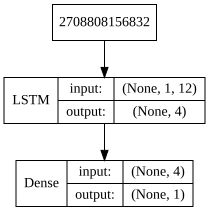

In [109]:
import keras
import pydot as pyd
import graphviz
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

keras.utils.vis_utils.pydot = pyd

#Visualize Model

def visualize_model(model):
  return SVG(model_to_dot(model).create(prog='dot', format='svg'))
#create your model
#then call the function on your model
visualize_model(model)

def plot_keras_model(model, show_shapes=True, show_layer_names=True):
    return SVG(model_to_dot(model, show_shapes=show_shapes, show_layer_names=show_layer_names).create(prog='dot',format='svg'))

plot_keras_model(model, show_shapes=True, show_layer_names=False)

In [110]:
model.fit(trainX, trainY, epochs=700, batch_size=1, verbose=2)

Epoch 1/700
 - 2s - loss: 0.0484
Epoch 2/700
 - 1s - loss: 0.0359
Epoch 3/700
 - 1s - loss: 0.0332
Epoch 4/700
 - 1s - loss: 0.0310
Epoch 5/700
 - 1s - loss: 0.0295
Epoch 6/700
 - 1s - loss: 0.0284
Epoch 7/700
 - 1s - loss: 0.0279
Epoch 8/700
 - 1s - loss: 0.0274
Epoch 9/700
 - 1s - loss: 0.0273
Epoch 10/700
 - 1s - loss: 0.0264
Epoch 11/700
 - 1s - loss: 0.0270
Epoch 12/700
 - 1s - loss: 0.0265
Epoch 13/700
 - 1s - loss: 0.0266
Epoch 14/700
 - 1s - loss: 0.0262
Epoch 15/700
 - 1s - loss: 0.0265
Epoch 16/700
 - 1s - loss: 0.0263
Epoch 17/700
 - 1s - loss: 0.0263
Epoch 18/700
 - 1s - loss: 0.0262
Epoch 19/700
 - 1s - loss: 0.0259
Epoch 20/700
 - 1s - loss: 0.0259
Epoch 21/700
 - 1s - loss: 0.0259
Epoch 22/700
 - 1s - loss: 0.0259
Epoch 23/700
 - 1s - loss: 0.0256
Epoch 24/700
 - 1s - loss: 0.0256
Epoch 25/700
 - 1s - loss: 0.0257
Epoch 26/700
 - 1s - loss: 0.0257
Epoch 27/700
 - 1s - loss: 0.0256
Epoch 28/700
 - 1s - loss: 0.0256
Epoch 29/700
 - 1s - loss: 0.0256
Epoch 30/700
 - 1s - lo

 - 1s - loss: 0.0187
Epoch 239/700
 - 1s - loss: 0.0186
Epoch 240/700
 - 1s - loss: 0.0187
Epoch 241/700
 - 1s - loss: 0.0184
Epoch 242/700
 - 1s - loss: 0.0185
Epoch 243/700
 - 1s - loss: 0.0187
Epoch 244/700
 - 1s - loss: 0.0184
Epoch 245/700
 - 1s - loss: 0.0186
Epoch 246/700
 - 1s - loss: 0.0188
Epoch 247/700
 - 1s - loss: 0.0184
Epoch 248/700
 - 1s - loss: 0.0185
Epoch 249/700
 - 1s - loss: 0.0185
Epoch 250/700
 - 1s - loss: 0.0185
Epoch 251/700
 - 1s - loss: 0.0186
Epoch 252/700
 - 1s - loss: 0.0185
Epoch 253/700
 - 1s - loss: 0.0184
Epoch 254/700
 - 1s - loss: 0.0185
Epoch 255/700
 - 1s - loss: 0.0186
Epoch 256/700
 - 1s - loss: 0.0184
Epoch 257/700
 - 1s - loss: 0.0184
Epoch 258/700
 - 1s - loss: 0.0184
Epoch 259/700
 - 1s - loss: 0.0184
Epoch 260/700
 - 1s - loss: 0.0182
Epoch 261/700
 - 1s - loss: 0.0187
Epoch 262/700
 - 1s - loss: 0.0183
Epoch 263/700
 - 1s - loss: 0.0181
Epoch 264/700
 - 1s - loss: 0.0183
Epoch 265/700
 - 1s - loss: 0.0184
Epoch 266/700
 - 1s - loss: 0.0182

Epoch 473/700
 - 1s - loss: 0.0166
Epoch 474/700
 - 1s - loss: 0.0164
Epoch 475/700
 - 1s - loss: 0.0164
Epoch 476/700
 - 1s - loss: 0.0162
Epoch 477/700
 - 1s - loss: 0.0164
Epoch 478/700
 - 1s - loss: 0.0164
Epoch 479/700
 - 1s - loss: 0.0164
Epoch 480/700
 - 1s - loss: 0.0163
Epoch 481/700
 - 1s - loss: 0.0165
Epoch 482/700
 - 1s - loss: 0.0165
Epoch 483/700
 - 1s - loss: 0.0162
Epoch 484/700
 - 1s - loss: 0.0162
Epoch 485/700
 - 1s - loss: 0.0163
Epoch 486/700
 - 1s - loss: 0.0165
Epoch 487/700
 - 1s - loss: 0.0162
Epoch 488/700
 - 1s - loss: 0.0163
Epoch 489/700
 - 1s - loss: 0.0161
Epoch 490/700
 - 1s - loss: 0.0162
Epoch 491/700
 - 1s - loss: 0.0159
Epoch 492/700
 - 1s - loss: 0.0163
Epoch 493/700
 - 1s - loss: 0.0163
Epoch 494/700
 - 1s - loss: 0.0163
Epoch 495/700
 - 1s - loss: 0.0162
Epoch 496/700
 - 1s - loss: 0.0162
Epoch 497/700
 - 1s - loss: 0.0161
Epoch 498/700
 - 1s - loss: 0.0161
Epoch 499/700
 - 1s - loss: 0.0163
Epoch 500/700
 - 1s - loss: 0.0162
Epoch 501/700
 - 1s 

### Predict values using the trained model

In [161]:
testX.shape

(71, 1, 12)

In [162]:
trainPredict = model.predict(trainX)
# testPredictInTrain = model.predict(trainX[-look_back:, :, :])
testPredict = model.predict(testX)

In [163]:
trainPredict.shape

(287, 1)

In [164]:
testY.shape

(71,)

In [165]:
trainY.shape

(287,)

In [166]:
testPredict.shape

(71, 1)

### Inverse transform the data

In [167]:
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
# testPredictInTrain = scaler.inverse_transform(testPredictInTrain)
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

In [168]:
testPredict.shape

(71, 1)

In [119]:
# trainPredict_dataset_like = np.zeros(shape=(len(trainPredict), 3) )
# trainPredict_dataset_like[:,0] = trainPredict[:,0]
# print(trainPredict_dataset_like)
# trainPredict = scaler.inverse_transform(trainPredict_dataset_like)[:,0]

In [120]:
# trainY.shape

In [121]:
# trainY_dataset_like = np.zeros(shape=(len(trainY), 3) )
# trainY_dataset_like[:,0] = trainY
# print(trainY_dataset_like)
# trainY = scaler.inverse_transform(trainY_dataset_like)[:,0]

In [122]:
# testPredict.shape

In [123]:
# testPredict_dataset_like = np.zeros(shape=(len(testPredict), 3) )
# testPredict_dataset_like[:,0] = testPredict[:,0]
# print(testPredict_dataset_like)
# testPredict = scaler.inverse_transform(testPredict_dataset_like)[:,0]

In [124]:
# testY.shape

In [125]:
# testY_dataset_like = np.zeros(shape=(len(testY), 3) )
# testY_dataset_like[:,0] = testY
# print(trainY_dataset_like)
# testY = scaler.inverse_transform(testY_dataset_like)[:,0]

### Calculate RMSE for train and test predictions

In [169]:
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))

Train Score: 0.78 RMSE
Test Score: 1.54 RMSE


### Generate dates for index

In [127]:
dates = rainfall_data['date']
print(dates)
dates.shape

0      1989.000000
1      1989.083333
2      1989.166667
3      1989.250000
4      1989.333333
          ...     
366    2019.500000
367    2019.583333
368    2019.666667
369    2019.750000
370    2019.833333
Name: date, Length: 371, dtype: float64


(371,)

### Create Dataframes for actual values and predicted values of train data

In [128]:
trainActual = pd.DataFrame({'Precipitation': trainY[0]})
# trainActual.index = dates[0:287]
trainActual.index = dates[12:299]

trainPredictdf = pd.DataFrame({'Precipitation': trainPredict[:,0]})
# trainPredictdf.index = dates[0:287]
trainPredictdf.index = dates[12:299]

In [129]:
print(trainX.shape)
print(trainX)

(287, 1, 12)
[[[0.30887372 0.25426621 0.61433447 ... 0.27133106 0.39761092 0.2337884 ]]

 [[0.25426621 0.61433447 0.1894198  ... 0.39761092 0.2337884  0.56825939]]

 [[0.61433447 0.1894198  0.45051195 ... 0.2337884  0.56825939 0.28156997]]

 ...

 [[0.00341297 0.37030717 0.64505119 ... 0.51023891 0.01535836 0.23208191]]

 [[0.37030717 0.64505119 0.51365188 ... 0.01535836 0.23208191 0.39931741]]

 [[0.64505119 0.51365188 0.31740614 ... 0.23208191 0.39931741 0.05119454]]]


In [130]:
trainY = trainY.reshape(287,)

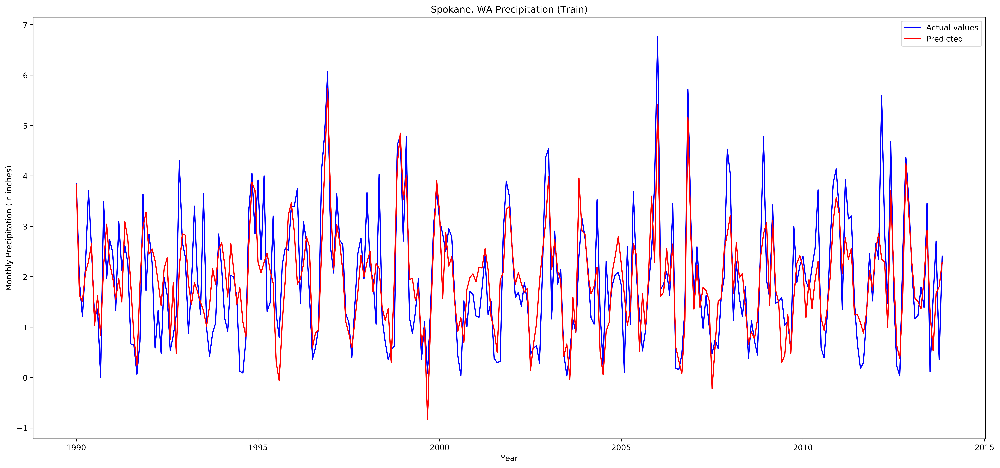

In [131]:
plt.figure(figsize=(22,10), dpi=400)
# plt.plot(dates[0:287], trainY, color='blue', label='Actual values')
# plt.plot(dates[0:287], trainPredictdf, color='red', label='Predicted')
plt.plot(trainActual, color='blue', label='Actual values')
plt.plot(trainPredictdf, color='red', label='Predicted')
plt.title('Spokane, WA Precipitation (Train)')
plt.xlabel('Year')
plt.ylabel('Monthly Precipitation (in inches)')
plt.legend(loc='best')

In [132]:
testPredict[:,0]

array([ 3.3564858 ,  1.6500118 ,  2.5027242 ,  1.5365103 ,  1.6817447 ,
        1.6197966 ,  0.5245879 ,  1.6805184 ,  1.592542  ,  1.6958128 ,
        3.1749048 ,  2.6865346 ,  4.277286  ,  1.584485  ,  2.0540752 ,
        1.4977529 ,  1.0055578 ,  1.0594028 ,  0.9590341 ,  1.323986  ,
        0.8110479 , -0.15842234,  4.190389  ,  3.5273082 ,  2.31601   ,
        0.08738543,  1.4193183 ,  0.32503545,  3.9288604 ,  1.3771628 ,
        3.442274  ,  1.1685022 ,  1.0446312 ,  1.1432474 ,  1.5891459 ,
        4.3286424 ,  4.222985  ,  2.0442486 ,  1.4615033 ,  1.9857682 ,
        1.972525  ,  0.60364753,  0.41237792,  0.5308641 ,  1.5272962 ,
        1.8899858 ,  2.6163363 ,  3.2889855 ,  2.8855405 ,  2.0211425 ,
        1.8293952 ,  1.329505  ,  1.5721788 ,  1.3825014 , -0.4158592 ,
        0.7349924 ,  0.9326809 ,  3.801686  ], dtype=float32)

In [171]:
testActual = pd.DataFrame({'Precipitation': testY[0]})
testActual.index = dates[300:]

testPredictdf = pd.DataFrame({'Precipitation': testPredict[:,0]})
testPredictdf.index = dates[300:]

In [172]:
testPredictdf.shape

(71, 1)

In [173]:
dates[313:].head()

313    2015.083333
314    2015.166667
315    2015.250000
316    2015.333333
317    2015.416667
Name: date, dtype: float64

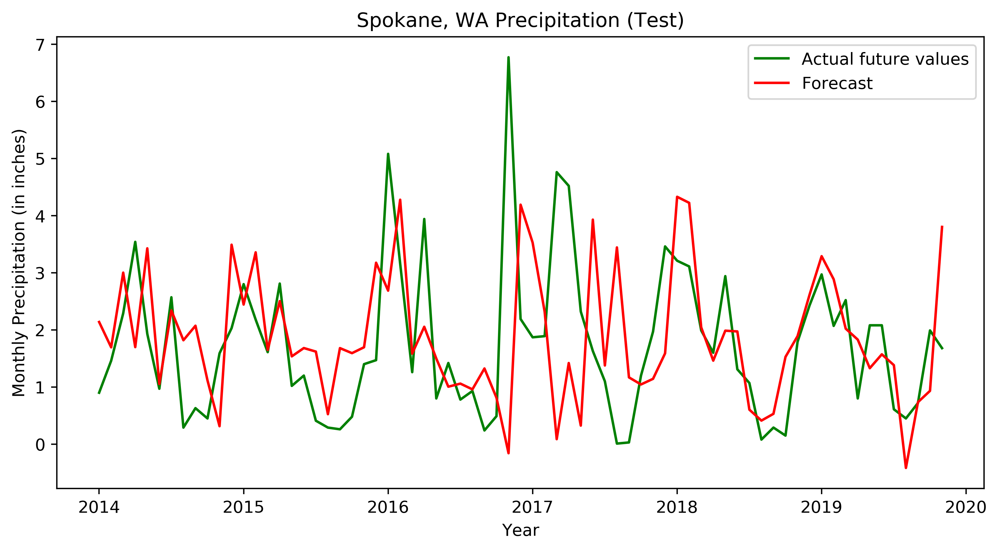

In [174]:
plt.figure(figsize=(10,5), dpi=400)
plt.plot(testActual, color='green', label='Actual future values')
plt.plot(testPredictdf, color='red', label='Forecast')
plt.title('Spokane, WA Precipitation (Test)')
plt.xlabel('Year')
plt.ylabel('Monthly Precipitation (in inches)')
plt.legend(loc='best')

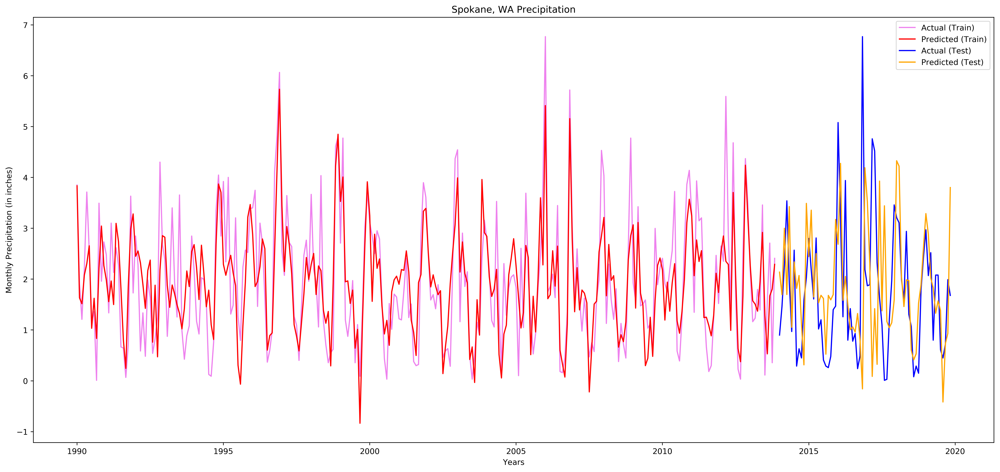

In [176]:
plt.figure(figsize=(22,10), dpi=400)
# plt.plot(dates[0:287], trainY, color='blue', label='Actual values')
# plt.plot(dates[0:287], trainPredictdf, color='red', label='Predicted')
plt.plot(trainActual, color='violet', label='Actual (Train)')
plt.plot(trainPredictdf, color='red', label='Predicted (Train)')
plt.plot(testActual, color='blue', label='Actual (Test)')
plt.plot(testPredictdf, color='orange', label='Predicted (Test)')
plt.title('Spokane, WA Precipitation')
plt.xlabel('Years')
plt.ylabel('Monthly Precipitation (in inches)')
plt.legend(loc='best')